In [1]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import jsonlines as jl

# Set data path

In [2]:
images_dir = "/home/rsr/gyl/RS_DATASET/FBP/train/rgb_images"
labels_dir = "/home/rsr/gyl/RS_DATASET/FBP/train/fbp_labels"

In [3]:
json_path = "/home/rsr/gyl/RS_Code/UHR_SAM/detect_uhr_boxes/jsonls/fbp_boxes.jsonl"

# Read json information

In [4]:
json_info = []
with jl.open(json_path, 'r') as f:
    for line in f:
       json_info.append(line) 

# Show boxes

In [5]:
def show_boxes(boxes):
    ax = plt.gca()
    ax.set_autoscale_on(False)
    for index, box in enumerate(boxes):
        x, y, w, h = box["coordinates"]
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(x + w, y, box["category"], fontsize=12, verticalalignment='top')

# Color palette

In [6]:
gid_colors = {
    0: (0,0,0),
    1: (255,0,0), # built-up
    2: (0,255,0), # farmland
    3: (0,255,255), # forest
    4: (255,255,0), # meadow
    5: (0,0,255) # water
}
fbp_colors = {
    0:[0,   0,   0], # unlabeled
    1: [200,   0,   0],# industrial area
    2: [0, 200,   0], # paddy field
    3: [150, 250,   0], #irrigated field
    4: [150, 200, 150], #dry cropland
    5: [200,   0, 200], # garden land
    6: [150,   0, 250], # arbor forest
    7: [150, 150, 250], # shrub forest
    8: [200, 150, 200], # park
    9: [250, 200,   0], # natural meadow
    10:[200, 200,   0], # artificial meadow
    11: [0,   0, 200], # river
    12: [250,   0, 150], # urban residential
    13: [0, 150, 200], # lake
    14: [0, 200, 250], # pond
    15: [150, 200, 250], # fish pond
    16:[250, 250, 250], # snow
    17:[200, 200, 200], # bareland
    18:[200, 150, 150], # rural residential
    19:[250, 200, 150], # stadium
    20:[150, 150,   0], # square
    21:[250, 150, 150], # road
    22:[250, 150,   0], # overpass
    23:[250, 200, 250], # railway station
    24:[200, 150,   0] # airport
}

# Process the information

In [7]:
data = json_info[101]

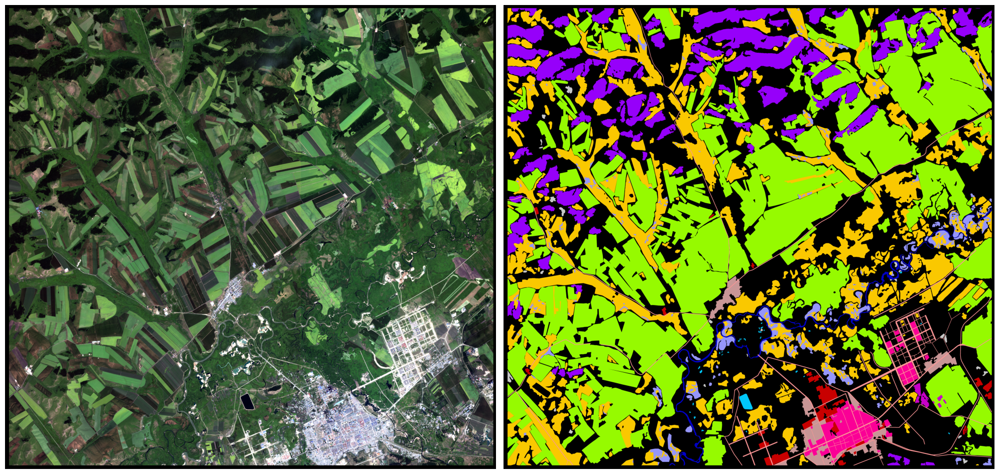

In [8]:
# load image
img_name = data["image_name"]
img_path = os.path.join(images_dir, img_name)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# load mask
mask_path = os.path.join(labels_dir, img_name.split('.')[0]+'_24label.png')
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
rgb_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
for idx, color in fbp_colors.items():
    rgb_mask[mask == idx] = color
fig, axs = plt.subplots(1,2, figsize=(20,10))
axs[0].imshow(image)
axs[0].axis('off')
axs[1].imshow(rgb_mask)
axs[1].axis('off')
plt.tight_layout()
plt.show()

# Separate images and masks are displayed

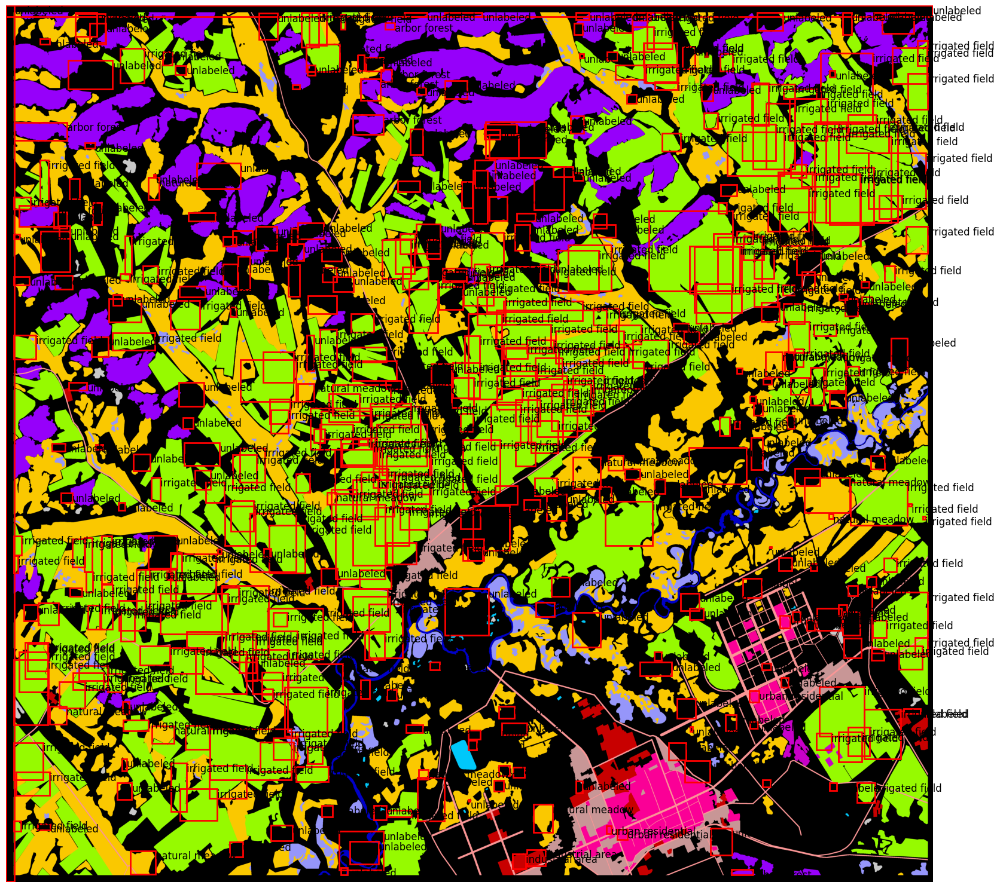

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(rgb_mask)
show_boxes(data["boxes"])
plt.axis('off')
plt.show()

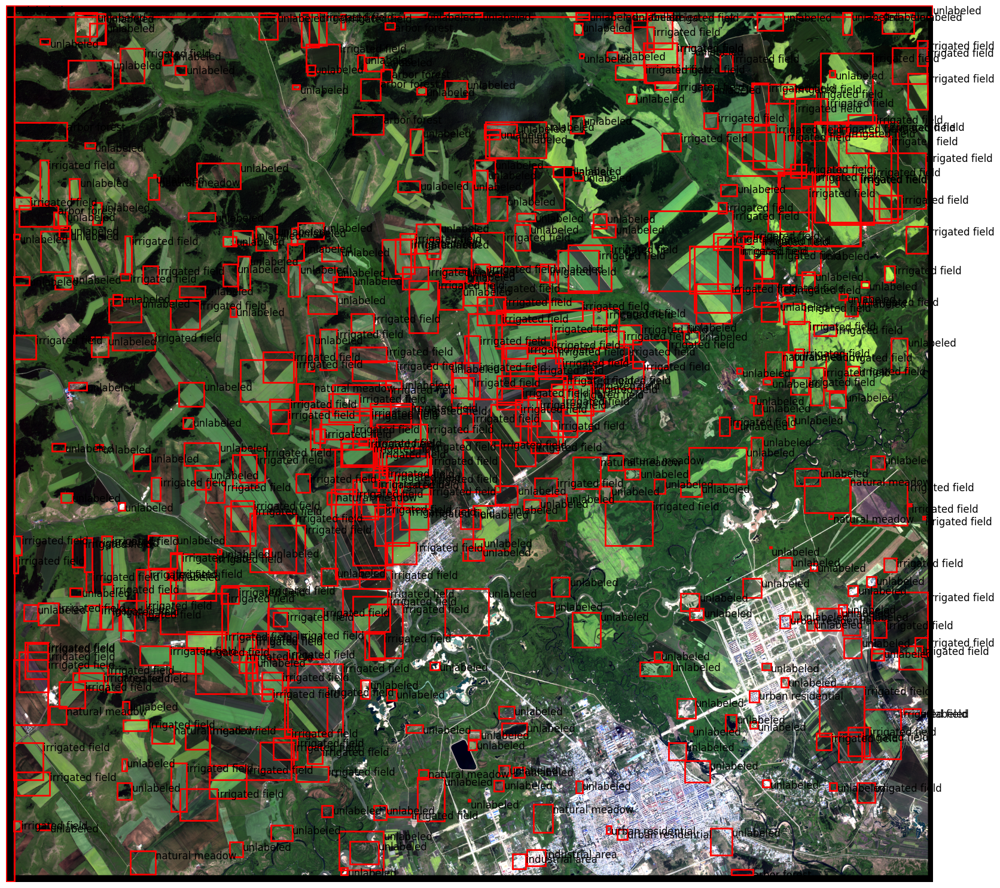

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_boxes(data["boxes"])
plt.axis('off')
plt.show()

## check length

In [11]:
min_objs = 2000
max_objs = 0
for img_data in json_info:
    min_objs = min(min_objs, len(img_data["boxes"]))
    max_objs = max(max_objs, len(img_data["boxes"]))
print("min_objs:{}; max_objs:{}".format(min_objs, max_objs))

min_objs:92; max_objs:869
